Lin, Y. and Jhou, Y., 2020. Estimation of heart rate and respiratory rate from the seismocardiogram under resting state. Biomedical Signal Processing and Control, 57, p.101779.

# IMPORTING LIBRARIES

In [1]:
import os
from kinopy.io import read_record
from scipy.signal import detrend, butter, sosfilt, resample, hilbert, find_peaks
from scipy.interpolate import interp1d
import pywt
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from psd2 import psd2
from sklearn.metrics import mean_absolute_error
from kinopy.commons.types import Number
from typing import Sequence, Optional, Literal, Tuple
import scipy.stats as st
import copy
import neurokit2 as nk

# DATA LOADING

In [2]:
main_path = "/home/giuseppeditursi/Documents/Data/K-ICB/raw_v2/"
path_all = []
for i in sorted(os.listdir(main_path)):
    sub_path = os.path.join(main_path, i)
    sub = sorted(os.listdir(sub_path))
    for k in sub:
        subsub_path = os.path.join(sub_path, k)
        subsub = sorted(os.listdir(subsub_path))
        if len(subsub) == 2:
            path_all.append((os.path.join(subsub_path, str(subsub[0]))))
            path_all.append((os.path.join(subsub_path, str(subsub[1]))))
        else:
            path_all.append((os.path.join(subsub_path, str(subsub[0]))))
            
path_all

['/home/giuseppeditursi/Documents/Data/K-ICB/raw_v2/Sub-A/BDC10/K-ICB_A_BDC10_20190330-101553_gwoB4aykkTA8fy',
 '/home/giuseppeditursi/Documents/Data/K-ICB/raw_v2/Sub-A/BDC9/K-ICB_A_BDC9_20190331-111511_BKe5wNpmMCVETk',
 '/home/giuseppeditursi/Documents/Data/K-ICB/raw_v2/Sub-A/BDC9/K-ICB_A_BDC9_20190331-112912_BKe5wrlWOhVETk',
 '/home/giuseppeditursi/Documents/Data/K-ICB/raw_v2/Sub-A/FAM/K-ICB_A_FAM_20190330-100233_vk0azV9DkUKXi4',
 '/home/giuseppeditursi/Documents/Data/K-ICB/raw_v2/Sub-A/HDT21/K-ICB_A_HDT21_20190429-110822_gwoxGB2nzSA8fy',
 '/home/giuseppeditursi/Documents/Data/K-ICB/raw_v2/Sub-A/HDT5/K-ICB_A_HDT5_20190413-090257_BKe0M07rPhVETk',
 '/home/giuseppeditursi/Documents/Data/K-ICB/raw_v2/Sub-A/HDT56/K-ICB_A_HDT56_20190603-110736_gwokQXN5vFA8fy',
 '/home/giuseppeditursi/Documents/Data/K-ICB/raw_v2/Sub-A/R1/K-ICB_A_R1_20190609-131324_bB5V5zalQtYqid',
 '/home/giuseppeditursi/Documents/Data/K-ICB/raw_v2/Sub-A/R1/K-ICB_A_R1_20190609-132625_bB5V5pwQQSYqid',
 '/home/giuseppeditursi

In [3]:
measurement = path_all[1]
record = read_record(measurement)
record

<Record 'K-ICB_A_BDC9_20190331-111511_BKe5wNpmMCVETk' (signals: 3, segmentations: 0, metrics: 0)>
Meta Data:
    id                      K-ICB_A_BDC9_20190331-111511_BKe5wNpmMCVETk
    code                    BDC9
    date                    2019-03-31T11:15:11+00:00
    subject                 A | Male | 1.8m | 72.8kg
    phone                   iPhone | iOS N/A | sw:2018.0.3.2
    device                  1.06 | hw:2017.0 | fw:2018.0.4.0
Signals:
    'ecg'                   electric/ecg        (451.06s, 200Hz)
    'scg'                   mechanical/scg      (451.06s, 200Hz)
    'bcg'                   mechanical/bcg      (451.06s, 200Hz)

In [4]:
fs = 200

In [5]:
scg = record.signals["scg"]
scg

<Biosignal 'scg' mechanical/scg (451.06s, 200Hz)>
Subsignals:  dis, vel, acc
Dimensions:  (motion: 2, time: 90212, axis: 3)

In [6]:
x = 0
y = 1
z = 2

# Lin
typ = 0
s1 = detrend(scg.vel[typ][:,x])      
s2 = detrend(scg.vel[typ][:,y])      
s3 = detrend(scg.vel[typ][:,z])      

# Rot
typ = 1
s4 = detrend(scg.vel[typ][:,x])       
s5 = detrend(scg.vel[typ][:,y])        
s6 = detrend(scg.vel[typ][:,z])  

# DATA PROCESSING

### Wavelet Decomposition

Dyadic tree-structured wavelet decomposition is conducted to extract the information related to heartbeat and respiration from SCG signal. 
In dyadic tree-structured wavelet decomposition, the signal is ﬁrstly split into low- and high-frequency components in the ﬁrst level. The low-frequency subband provides the coarser part in the original signal, whereas the high-frequency subband contains the detailed information of the original signal, and they are respectively termed as the approximation and the detail in wavelet analysis.

Among miscellaneous types of wavelets, the Daubechies wavelet is selected for the sake of its potential in the implementation of fast algorithm. Daubechies 6 wavelet (db6) is adopted for the reason of the moderately smooth shape on wavelet function. Another reason is that the oscillating pattern of db6 wavelet is similar to the shape of heartbeat and respiration pattern buried in SCG under different scales. 

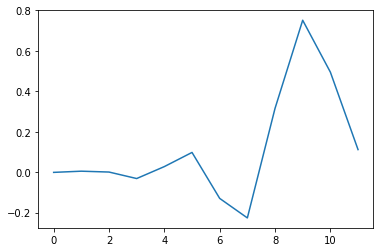

In [7]:
w = pywt.Wavelet('db6')
plt.plot(w.dec_lo)
coeffs = pywt.wavedec(s6, w, level=8)

## RESPIRATION

In [8]:
time_frame = [10.806, 50.806]

### RESPIRATION EXTRACTION

In [9]:
#reconstruction_plot(pywt.waverec(coeffs, w)) # full reconstruction 
#reconstruction_plot(pywt.waverec(coeffs[:-1] + [None] * 1, w)) # leaving out detail coefficients up to lvl 7
#reconstruction_plot(pywt.waverec(coeffs[:-2] + [None] * 2, w)) # leaving out detail coefficients up to lvl 6
#reconstruction_plot(pywt.waverec(coeffs[:-3] + [None] * 3, w)) # leaving out detail coefficients up to lvl 5
#reconstruction_plot(pywt.waverec(coeffs[:-4] + [None] * 4, w)) # leaving out detail coefficients up to lvl 4
#reconstruction_plot(pywt.waverec(coeffs[:-5] + [None] * 5, w)) # leaving out detail coefficients up to lvl 3
#reconstruction_plot(pywt.waverec(coeffs[:-6] + [None] * 6, w)) # leaving out detail coefficients up to lvl 2
#reconstruction_plot(pywt.waverec(coeffs[:-7] + [None] * 7, w)) # leaving out detail coefficients up to lvl 1
resp = pywt.waverec(coeffs[:-8] + [None] * 8, w) # leaving out all detail coefficients = reconstruction using lvl1 approximation only

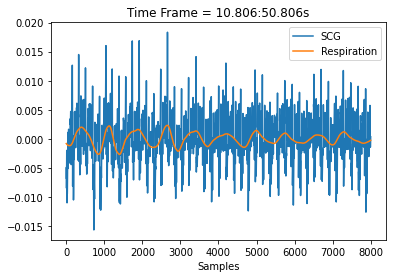

In [10]:
s6_cut = s6[int(time_frame[0]*fs):int(time_frame[1]*fs)]
plt.plot(s6_cut)
resp_cut = resp[int(time_frame[0]*fs):int(time_frame[1]*fs)]
plt.plot(resp_cut)
plt.xlabel('Samples')
plt.title('Time Frame = ' +str(time_frame[0])+ ':' +str(time_frame[1])+ 's')
plt.legend(['SCG', 'Respiration'])

Only the approximation level has been chosen to extract respiration, being this latter within 0-0.4 Hz in general.

NOTE: The first element (cA_n) of the result is approximation coefficients array and the following elements (cD_n - cD_1) are details coefficients arrays.

### Cleaning

Khodadad et al. (2018) https://iopscience.iop.org/article/10.1088/1361-6579/aad7e6/meta

BioSPPy https://github.com/PIA-Group/BioSPPy/blob/master/biosppy/signals/resp.py

Clean a respiration signal using different sets of parameters, such as 'khodadad2018' (linear detrending followed by a fifth order 2Hz low-pass IIR Butterworth filter) or 'BioSPPy' (second order 0.1 - 0.35 Hz bandpass Butterworth filter followed by a constant detrending).

Text(0.5, 1.0, 'RESPIRATION - Time Frame = 10.806:50.806s')

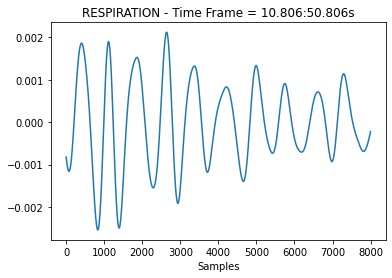

In [11]:
resp = nk.rsp.rsp_clean(resp)
resp_cut = resp[int(time_frame[0]*fs):int(time_frame[1]*fs)]
plt.plot(resp_cut)
plt.xlabel('Samples')
plt.title('RESPIRATION - Time Frame = ' +str(time_frame[0])+ ':' +str(time_frame[1])+ 's')

### Detrending

Text(0.5, 1.0, 'RESPIRATION - Time Frame = 10.806:50.806s')

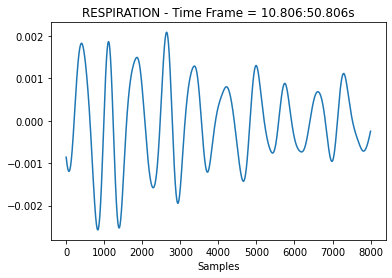

In [12]:
resp = detrend(resp)
resp_cut = resp[int(time_frame[0]*fs):int(time_frame[1]*fs)]
plt.plot(resp_cut)
plt.xlabel('Samples')
plt.title('RESPIRATION - Time Frame = ' +str(time_frame[0])+ ':' +str(time_frame[1])+ 's')

### Normalization

In [13]:
def scale_normalization(
    arr: np.ndarray,
    mode: Literal["range", "sum", "rss", "rms"] = "range",
    rg: Optional[Tuple[float, float]] = None,
) -> np.ndarray:
    """
    1D array
    """
    mx = np.max(arr)
    mn = np.min(arr)
    d = mx - mn
    if d == 0:
        return np.zeros_like(arr)
    s = arr - mn
    if mode == "range":
        if rg is None:
            rg = 0.0, 1.0
        ba = rg[1] - rg[0]
        a = rg[0]
        return (s * ba / d) + a
    elif mode == "sum":
        return s / np.sum(s)
    elif mode == "rss":
        return s / np.sqrt(np.sum(np.square(s)))
    elif mode == "rms":
        return s / np.sqrt(np.sum(np.square(s)) / len(s))

### Standardization

In [14]:
def interquartile_range(
    arr: np.ndarray, q: Optional[Sequence[Number]] = None, axis: int = 0
) -> float:
    """
    1D array
    """
    if q is None:
        q = [25, 75]
    return st.iqr(arr, axis=axis, rng=q, nan_policy="omit")

def scale_standardization_robust(
    arr: np.ndarray, q: Optional[Sequence[Number]] = None, axis: int = 0
) -> np.ndarray:
    return (arr - np.median(arr, axis=axis)) / interquartile_range(arr, q, axis=axis)

Text(0.5, 1.0, 'RESPIRATION - Time Frame = 10.806:50.806s')

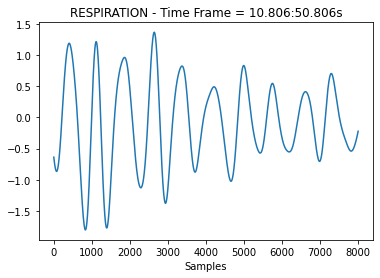

In [15]:
resp = scale_standardization_robust(resp)
resp_cut = resp[int(time_frame[0]*fs):int(time_frame[1]*fs)]
plt.plot(resp_cut)
plt.xlabel('Samples')
plt.title('RESPIRATION - Time Frame = ' +str(time_frame[0])+ ':' +str(time_frame[1])+ 's')

### Correction Respiration Sign 

In [16]:
def _correct_rsp_sign(
    rsp: np.ndarray, fs: int, distance_ms: int, prominence: float
) -> np.ndarray:
    distance = int(distance_ms * fs / 1000)
    rsp_max_idx, _ = find_peaks(rsp, distance=distance, prominence=prominence)
    rsp_min_idx, _ = find_peaks(-rsp, distance=distance, prominence=prominence)

    i = 0
    j = 0
    lengths_min_max = []
    lengths_max_min = []

    prev_min_max = False
    prev_max_min = False

    while i < len(rsp_min_idx) and j < len(rsp_max_idx):
        min_i = rsp_min_idx[i]
        max_j = rsp_max_idx[j]

        if min_i < max_j:
            length = max_j - min_i
            if not prev_min_max:
                lengths_min_max.append(length)
            prev_min_max = True
            prev_max_min = False
            i += 1
        else:
            length = min_i - max_j
            if not prev_max_min:
                lengths_max_min.append(length)
            prev_min_max = False
            prev_max_min = True
            j += 1

    length_med_min_max = np.median(lengths_min_max)
    length_med_max_min = np.median(lengths_max_min)

    if length_med_min_max > length_med_max_min:
        rsp_corr = -rsp
    else:
        rsp_corr = rsp

    return rsp_corr

Text(0.5, 1.0, 'RESPIRATION - Time Frame = 10.806:50.806s')

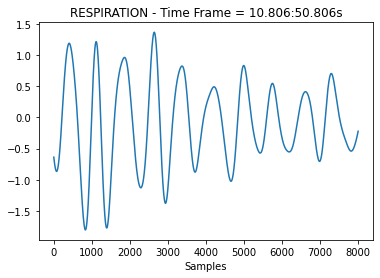

In [17]:
distance_ms = 1000
prominence = 0.25
resp = _correct_rsp_sign(resp, fs, distance_ms=distance_ms, prominence=prominence)
resp_cut = resp[int(time_frame[0]*fs):int(time_frame[1]*fs)]
plt.plot(resp_cut)
plt.xlabel('Samples')
plt.title('RESPIRATION - Time Frame = ' +str(time_frame[0])+ ':' +str(time_frame[1])+ 's')

### RESPIRATION PERIOD COMPUTATION

In [18]:
time_points = [10.806, 50.806, 110.806, 190.806, 290.806]
time_frames = [[time_points[i], time_points[i + 1]]
        for i in range(len(time_points) - 1)]

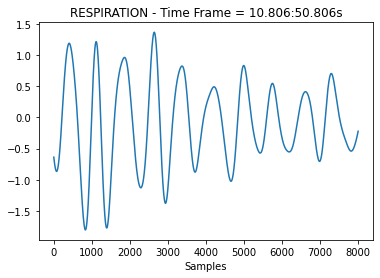

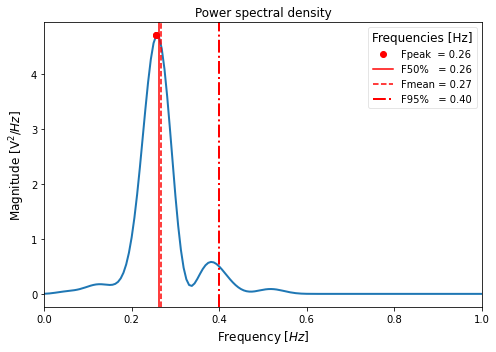

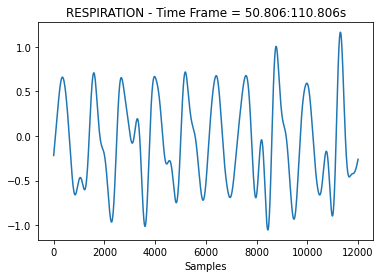

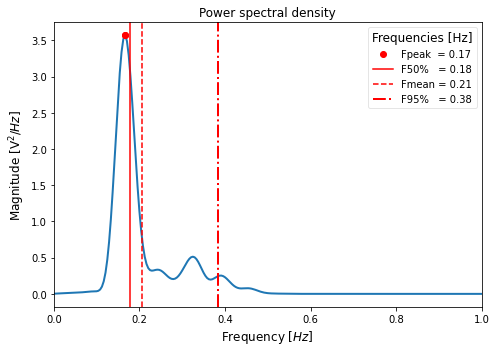

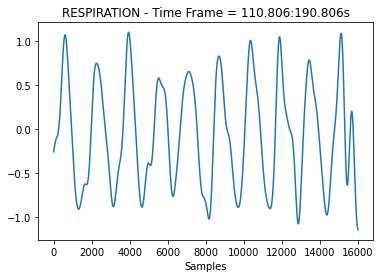

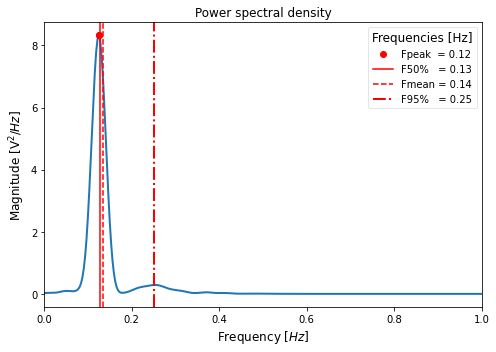

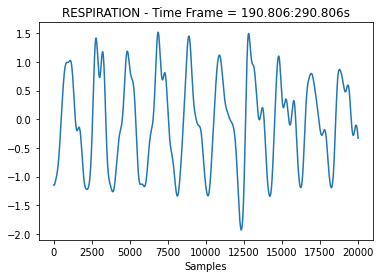

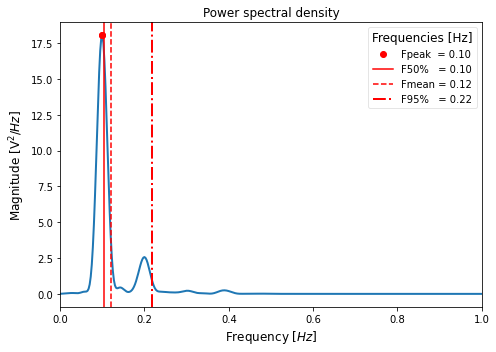

In [19]:
resp_period_all_comp = []

for k in time_frames:
    resp_cut = resp[int(k[0]*fs):int(k[1]*fs)]
    plt.figure()
    plt.plot(resp_cut)
    plt.xlabel('Samples')
    plt.title('RESPIRATION - Time Frame = ' +str(k[0])+ ':' +str(k[1])+ 's')
    fpcntile, mpf, fmax, Ptotal, f, P = psd2(resp_cut-np.mean(resp_cut), fs=fs, nfft=8*np.ceil(len(resp_cut)/2), show=True, xlim=(0, 1))
    resp_period = 1/fmax
    resp_period_all_comp.append(resp_period)

Text(0.5, 1.0, 'Sub-A/BDC9/K-ICB_A_BDC9_20190331-111511_BKe5wNpmMCVETk\nMAE: 0.02s')

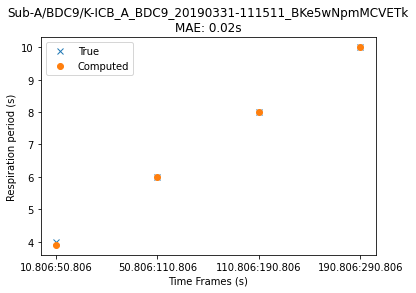

In [20]:
main_path = os.path.normpath(measurement)
sec_path = main_path.split(os.sep)
sec_path = sec_path[7]+'/'+sec_path[8]+'/'+sec_path[9]

resp_period_all_true = [4, 6, 8, 10]
err = mean_absolute_error(resp_period_all_true, resp_period_all_comp)
plt.figure()
x = np.array([0,1,2,3])
my_xticks = ['10.806:50.806','50.806:110.806','110.806:190.806','190.806:290.806']
plt.xticks(x, my_xticks)
plt.plot(my_xticks, resp_period_all_true, 'x')
plt.plot(my_xticks, resp_period_all_comp, 'o')
plt.xlabel('Time Frames (s)')
plt.ylabel("Respiration period (s)")
plt.legend(['True', 'Computed'])
plt.title(sec_path+ '\nMAE: ' +str(format(err, ".2f"))+ 's')

For all measurements.

In [21]:
del path_all[96]
del path_all[227]

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


/tmp/ipykernel_77379/2587963694.py:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263


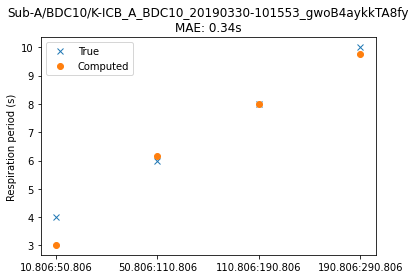

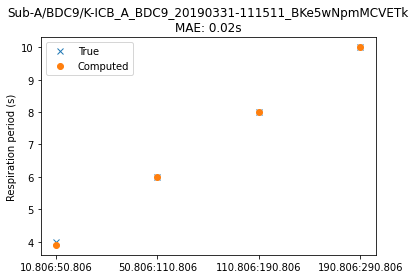

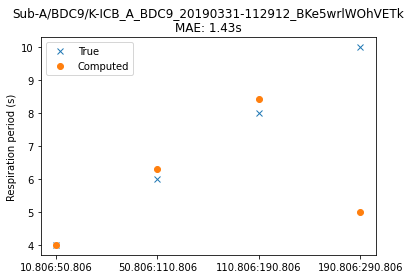

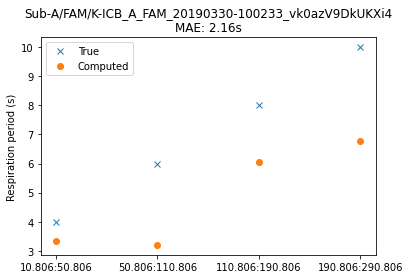

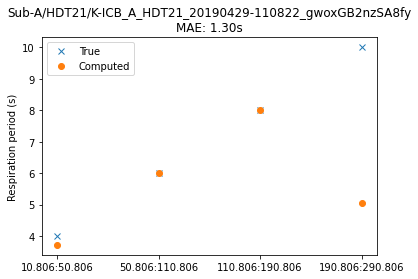

...

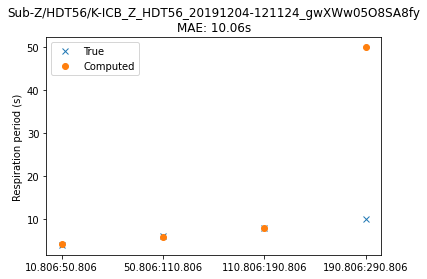

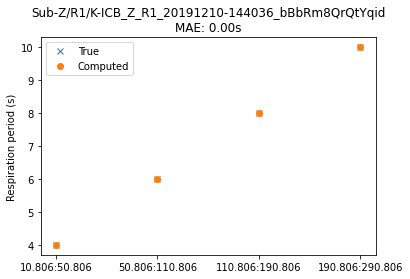

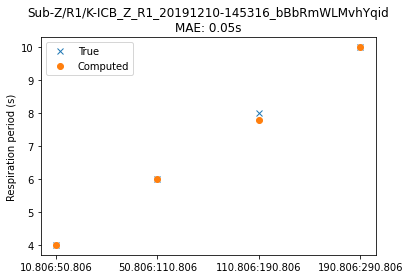

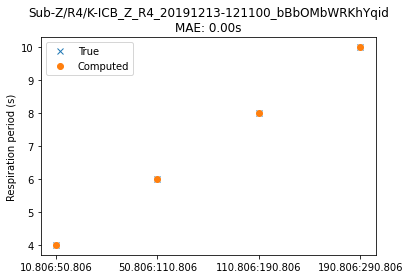

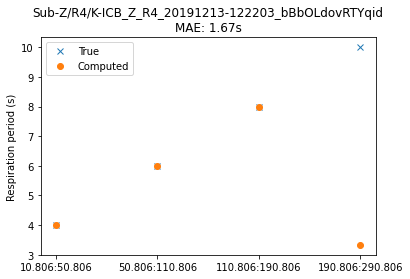

In [22]:
window_smooth_ms = 1000
distance_ms = 1000
prominence = 0.25

sec_path_all = []
resp_err_all = []

for idx, i in enumerate(path_all):
    print(idx)
    record = read_record(i)
    scg = record.signals["scg"]
    s6 = detrend(scg.vel[1][:,2])
    coeffs = pywt.wavedec(s6, w, level=8)
    resp = pywt.waverec(coeffs[:-8] + [None] * 8, w)
    resp = nk.rsp.rsp_clean(resp)
    resp = detrend(resp)
    resp = scale_normalization(resp, rg=(-1, 1))
    resp = scale_standardization_robust(resp)
    resp = _correct_rsp_sign(resp, fs, distance_ms=distance_ms, prominence=prominence)
    resp_period_all_comp = []
    for k in time_frames:
        resp_cut = resp[int(k[0]*fs):int(k[1]*fs)]
        fpcntile, mpf, fmax, Ptotal, f, P = psd2(resp_cut-np.mean(resp_cut), fs=fs, nfft=8*np.ceil(len(resp_cut)/2), show=False)
        resp_period = 1/fmax
        resp_period_all_comp.append(resp_period) 
    main_path = os.path.normpath(i)
    sec_path = main_path.split(os.sep)
    sec_path = sec_path[7]+'/'+sec_path[8]+'/'+sec_path[9]
    sec_path_all.append(sec_path)
    resp_period_all_true = [4, 6, 8, 10]
    err = mean_absolute_error(resp_period_all_true, resp_period_all_comp)
    resp_err_all.append(err)
    plt.figure()
    x = np.array([0,1,2,3])
    my_xticks = ['10.806:50.806','50.806:110.806','110.806:190.806','190.806:290.806']
    plt.xticks(x, my_xticks)
    plt.plot(my_xticks, resp_period_all_true, 'x')
    plt.plot(my_xticks, resp_period_all_comp, 'o')
    plt.ylabel("Respiration period (s)")
    plt.legend(['True', 'Computed'])
    plt.title(sec_path+ '\nMAE: ' +str(format(err, ".2f"))+ 's')

Text(0, 0.5, 'MAE (s)')

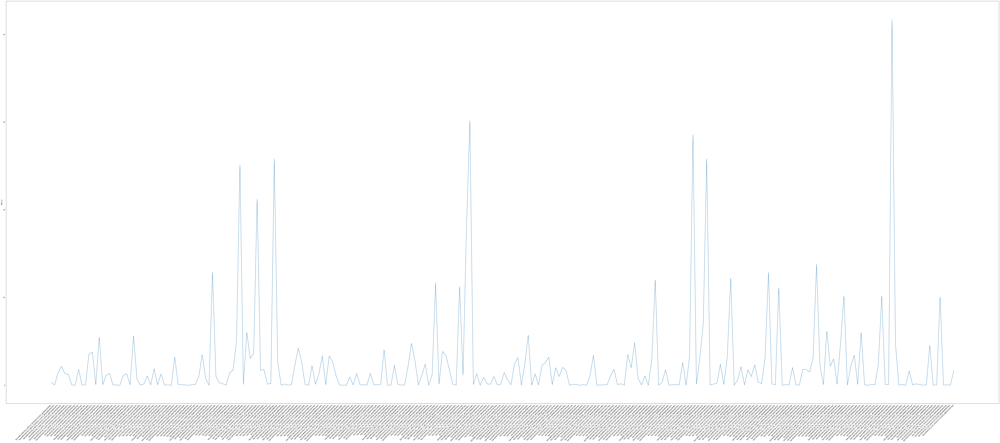

In [23]:
plt.figure(figsize=(120, 50))
x = np.array(range(len(sec_path_all)))
my_xticks = sec_path_all
plt.xticks(x, my_xticks, rotation=45, ha="right")
plt.plot(my_xticks, resp_err_all)
plt.ylabel("MAE (s)")

In [24]:
import pickle

with open("/home/giuseppeditursi/Desktop/Respiration_from_SCG/2_Resp_Extraction/5_Wavelets/Wavelets_resp_err_all", "wb") as fp:   #Pickling
    pickle.dump(resp_err_all, fp)

## HEART BEATS

In [25]:
time_frame = [10.806, 50.806]

### HEART BEATS EXTRACTION

The heart rate from the SCG is now computed.
By inspecting on the pattern of SCG with respective to that of ECG, it can be observed that SCG is an oscillated signal that contains higher harmonics (more than 7) of the fundamental heartbeat component. This implies that the frequency range of heartbeat component acquired from SCG covers at least seven times of the fundamental heartbeat frequency which can be acquired by the beat-to-beat interval from ECG signal. As the fundamental heartbeat frequency is near around 1 Hz, the heartbeat from SCG may contain the components above 7 Hz and are therefore approximated by the sum of f and g wavelet levels here.

In [26]:
coeffs_HR = copy.deepcopy(coeffs)

a = coeffs_HR[0]    # 0-0.390625 Hz
b = coeffs_HR[1]    # 0.390625-0.78125 Hz
c = coeffs_HR[2]    # 0.78125-1.5625 Hz
d = coeffs_HR[3]    # 1.5625-3.125 Hz
e = coeffs_HR[4]    # 3.125-6.25 Hz
f = coeffs_HR[5]    # 6.25-12.5 Hz
g = coeffs_HR[6]    # 12.5-25 Hz
h = coeffs_HR[7]    # 25-50 Hz
i = coeffs_HR[8]    # 50-100 Hz


a[:len(a)] = 0
b[:len(b)] = 0
c[:len(c)] = 0
d[:len(d)] = 0
e[:len(e)] = 0
h[:len(h)] = 0
i[:len(i)] = 0

HB = pywt.waverec(coeffs_HR, w) # heartbeat reconstruction

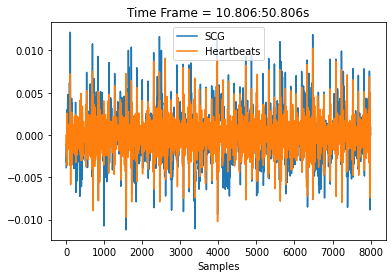

In [27]:
s6_cut = s6[int(time_frame[0]*fs):int(time_frame[1]*fs)]
plt.plot(s6_cut)
HB_cut = HB[int(time_frame[0]*fs):int(time_frame[1]*fs)]
plt.plot(HB_cut)
plt.xlabel('Samples')
plt.title('Time Frame = ' +str(time_frame[0])+ ':' +str(time_frame[1])+ 's')
plt.legend(['SCG', 'Heartbeats'])

### Envelope 

The heart rate from the SCG heartbeat signal is now computed from the envelope of the heartbeat signal.

In [28]:
analytic_signal = hilbert(HB)
envelope = np.abs(analytic_signal)

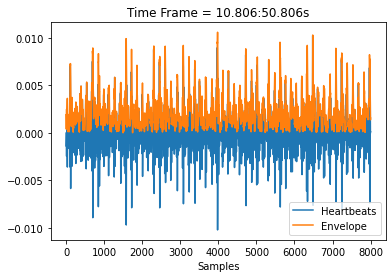

In [29]:
HB_cut = HB[int(time_frame[0]*fs):int(time_frame[1]*fs)]
plt.plot(HB_cut)
env_cut = envelope[int(time_frame[0]*fs):int(time_frame[1]*fs)]
plt.plot(env_cut)
plt.xlabel('Samples')
plt.title('Time Frame = ' +str(time_frame[0])+ ':' +str(time_frame[1])+ 's')
plt.legend(['Heartbeats', 'Envelope'])

### Detrending

Text(0.5, 1.0, 'ENVELOPE - Time Frame = 10.806:50.806s')

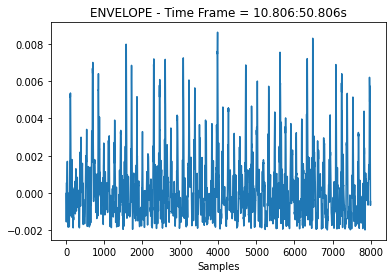

In [30]:
envelope = detrend(envelope)
envelope_cut = envelope[int(time_frame[0]*fs):int(time_frame[1]*fs)]
plt.plot(envelope_cut)
plt.xlabel('Samples')
plt.title('ENVELOPE - Time Frame = ' +str(time_frame[0])+ ':' +str(time_frame[1])+ 's')

### Normalization

In [31]:
def scale_normalization(
    arr: np.ndarray,
    mode: Literal["range", "sum", "rss", "rms"] = "range",
    rg: Optional[Tuple[float, float]] = None,
) -> np.ndarray:
    """
    1D array
    """
    mx = np.max(arr)
    mn = np.min(arr)
    d = mx - mn
    if d == 0:
        return np.zeros_like(arr)
    s = arr - mn
    if mode == "range":
        if rg is None:
            rg = 0.0, 1.0
        ba = rg[1] - rg[0]
        a = rg[0]
        return (s * ba / d) + a
    elif mode == "sum":
        return s / np.sum(s)
    elif mode == "rss":
        return s / np.sqrt(np.sum(np.square(s)))
    elif mode == "rms":
        return s / np.sqrt(np.sum(np.square(s)) / len(s))

Text(0.5, 1.0, 'ENVELOPE - Time Frame = 10.806:50.806s')

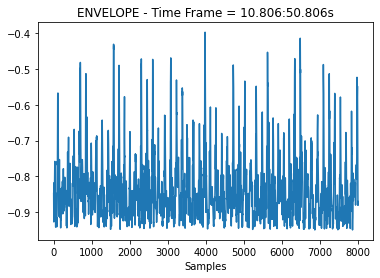

In [32]:
envelope = scale_normalization(envelope, rg=(-1, 1))
envelope_cut = envelope[int(time_frame[0]*fs):int(time_frame[1]*fs)]
plt.plot(envelope_cut)
plt.xlabel('Samples')
plt.title('ENVELOPE - Time Frame = ' +str(time_frame[0])+ ':' +str(time_frame[1])+ 's')

### Standardization

In [33]:
def interquartile_range(
    arr: np.ndarray, q: Optional[Sequence[Number]] = None, axis: int = 0
) -> float:
    """
    1D array
    """
    if q is None:
        q = [25, 75]
    return st.iqr(arr, axis=axis, rng=q, nan_policy="omit")

def scale_standardization_robust(
    arr: np.ndarray, q: Optional[Sequence[Number]] = None, axis: int = 0
) -> np.ndarray:
    return (arr - np.median(arr, axis=axis)) / interquartile_range(arr, q, axis=axis)

Text(0.5, 1.0, 'ENVELOPE - Time Frame = 10.806:50.806s')

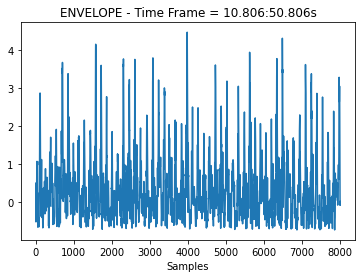

In [34]:
envelope = scale_standardization_robust(envelope)
envelope_cut = envelope[int(time_frame[0]*fs):int(time_frame[1]*fs)]
plt.plot(envelope_cut)
plt.xlabel('Samples')
plt.title('ENVELOPE - Time Frame = ' +str(time_frame[0])+ ':' +str(time_frame[1])+ 's')

### HEART RATE COMPUTATION

The heart rate from the ECG is first computed as a reference.

In [35]:
ecg = record.signals["ecg"]
ecg = detrend(ecg.lead_I)

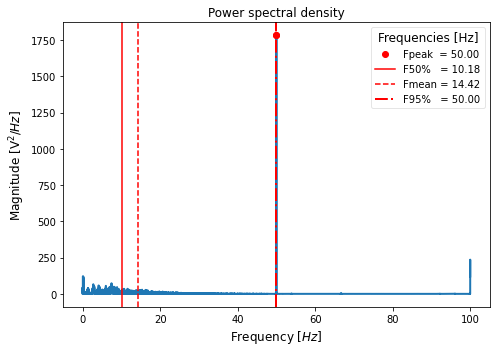

In [36]:
fpcntile, mpf, fmax, Ptotal, f, P = psd2(ecg-np.mean(ecg), fs=fs, nfft=8*np.ceil(len(ecg)/2), show=True)

In [37]:
f1 = 45
f2 = 55
sos = butter(4, [f1, f2], 'bandstop', fs=fs, output='sos')
ecg_filt = sosfilt(sos, ecg)

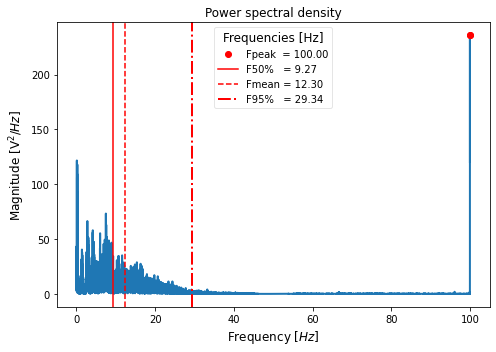

In [38]:
fpcntile, mpf, fmax, Ptotal, f, P = psd2(ecg_filt-np.mean(ecg_filt), fs=fs, nfft=8*np.ceil(len(ecg_filt)/2), show=True)

In [39]:
f1 = 3
f2 = 45
sos = butter(4, [f1, f2], 'bandpass', fs=fs, output='sos')
ecgfilt_filt = sosfilt(sos, ecg_filt)

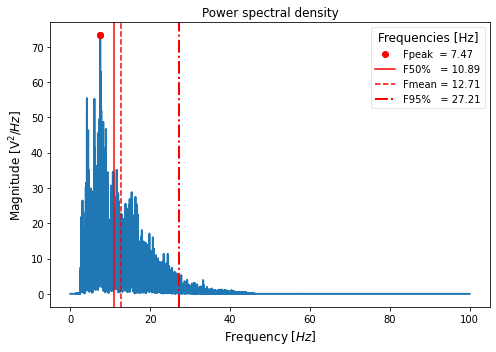

In [40]:
fpcntile, mpf, fmax, Ptotal, f, P = psd2(ecgfilt_filt-np.mean(ecgfilt_filt), fs=fs, nfft=8*np.ceil(len(ecgfilt_filt)/2), show=True)

In [41]:
def ecgfilt(data):
    
    f1 = 45
    f2 = 55
    sos = butter(4, [f1, f2], 'bandstop', fs=fs, output='sos')
    ecg_filt = sosfilt(sos, data)
    
    f1 = 3
    f2 = 45
    sos = butter(4, [f1, f2], 'bandpass', fs=fs, output='sos')
    ecgfilt_filt = sosfilt(sos, ecg_filt)
    
    return ecgfilt_filt

ecg_filt = ecgfilt(ecg)

In [42]:
time_points = [10.806, 50.806, 110.806, 190.806, 290.806]
time_frames = [[time_points[i], time_points[i + 1]]
        for i in range(len(time_points) - 1)]

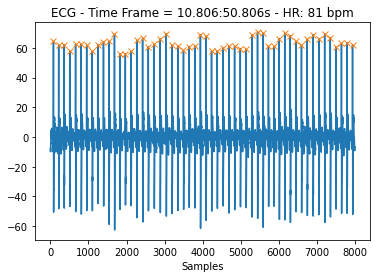

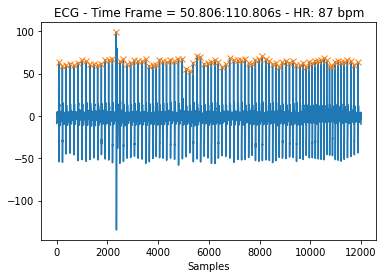

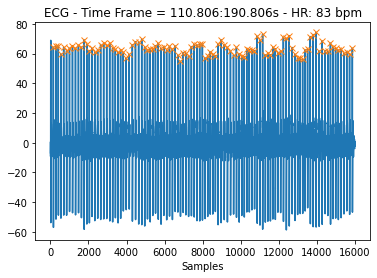

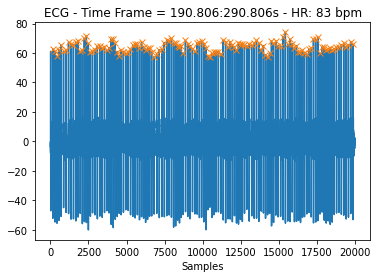

In [43]:
HR_all_true = []
for k in time_frames:
    ecg_cut = ecg_filt[int(k[0]*fs):int(k[1]*fs)]
    peaks = nk.ecg.ecg_findpeaks(ecg_cut, sampling_rate=fs)
    peaks_t = peaks['ECG_R_Peaks']/fs
    HR_ECG = np.nanmean(60./np.diff(peaks_t))
    plt.figure()
    plt.plot(ecg_cut)
    plt.plot(peaks['ECG_R_Peaks'], ecg_cut[peaks['ECG_R_Peaks']], "x")
    plt.xlabel('Samples')
    plt.title('ECG - Time Frame = ' +str(k[0])+ ':' +str(k[1])+ 's - HR: ' +str(round(HR_ECG))+ ' bpm')
    HR_all_true.append(HR_ECG)

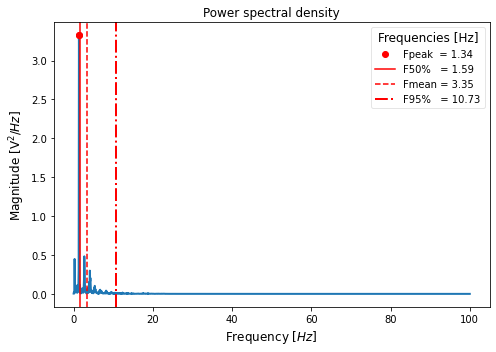

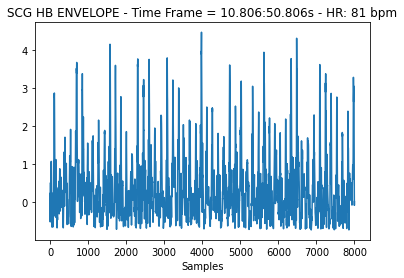

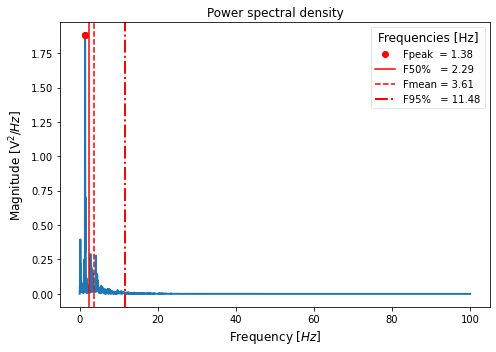

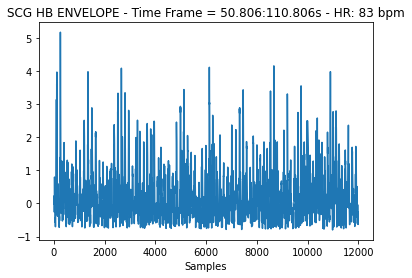

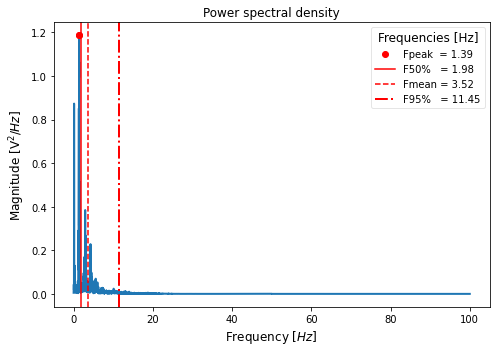

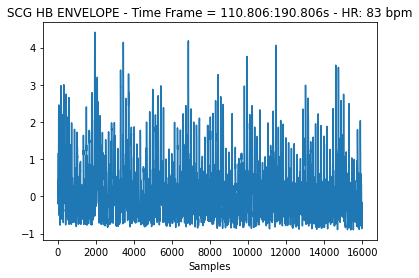

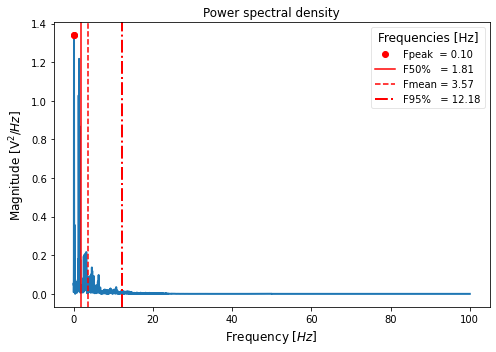

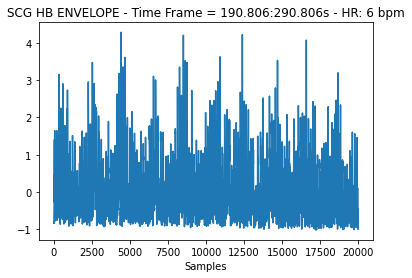

In [44]:
HR_all_computed = []
for k in time_frames:
    env_cut = envelope[int(k[0]*fs):int(k[1]*fs)]
    fpcntile, mpf, fmax, Ptotal, f, P = psd2(env_cut-np.mean(env_cut), fs=fs, nfft=8*np.ceil(len(env_cut)/2), show=True)
    HR_SCG = fmax*60
    plt.figure()
    plt.plot(env_cut)
    plt.xlabel('Samples')
    plt.title('SCG HB ENVELOPE - Time Frame = ' +str(k[0])+ ':' +str(k[1])+ 's - HR: ' +str(round(HR_SCG))+ ' bpm')
    HR_all_computed.append(HR_SCG)

Text(0.5, 1.0, 'Sub-A/BDC9/K-ICB_A_BDC9_20190331-111511_BKe5wNpmMCVETk\nMAE: 20.67s')

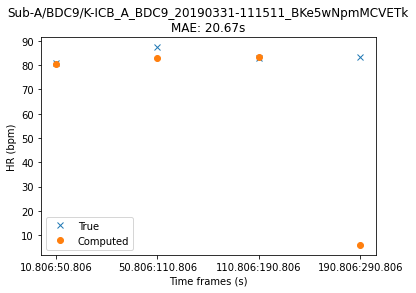

In [45]:
main_path = os.path.normpath(measurement)
sec_path = main_path.split(os.sep)
sec_path = sec_path[7]+'/'+sec_path[8]+'/'+sec_path[9]

err = mean_absolute_error(HR_all_true, HR_all_computed)
plt.figure()
x = np.array([0,1,2,3])
my_xticks = ['10.806:50.806','50.806:110.806','110.806:190.806','190.806:290.806']
plt.xticks(x, my_xticks)
plt.plot(my_xticks, HR_all_true, 'x')
plt.plot(my_xticks, HR_all_computed, 'o')
plt.xlabel('Time frames (s)')
plt.ylabel("HR (bpm)")
plt.legend(['True', 'Computed'])
plt.title(sec_path+ '\nMAE: ' +str(format(err, ".2f"))+ 's')

For all measurements.

In [46]:
del path_all[96]
del path_all[227]

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20


/tmp/ipykernel_77379/19722337.py:58: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261


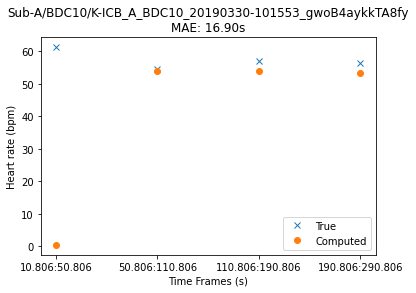

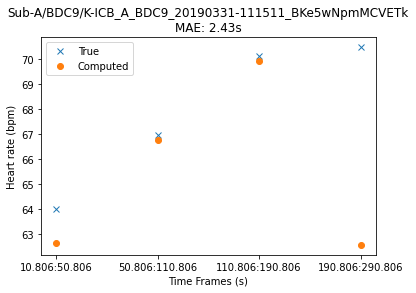

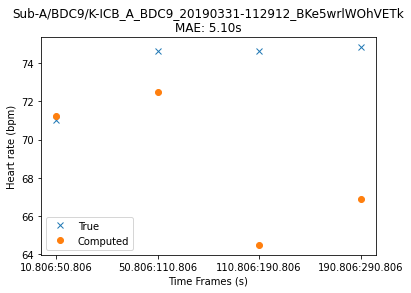

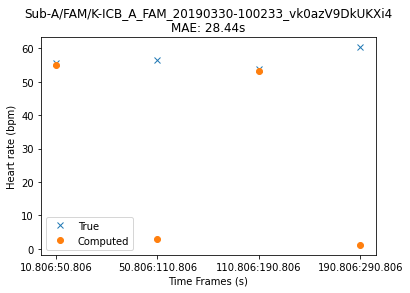

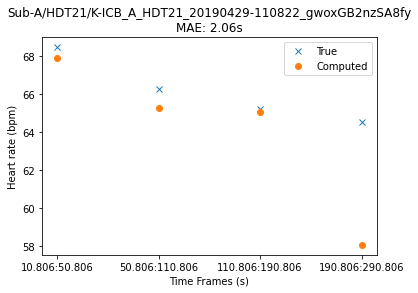

...

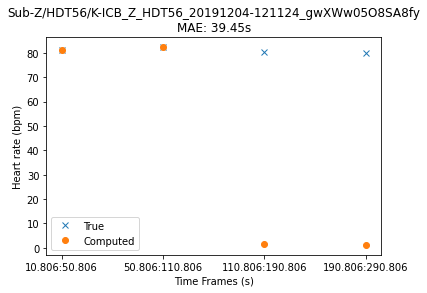

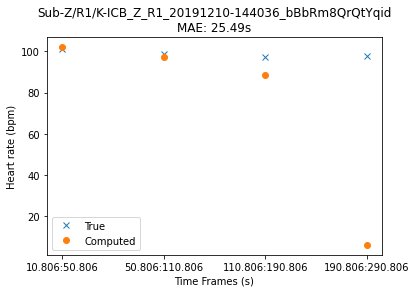

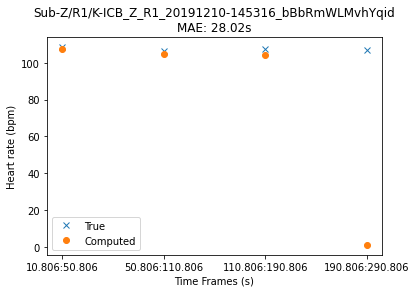

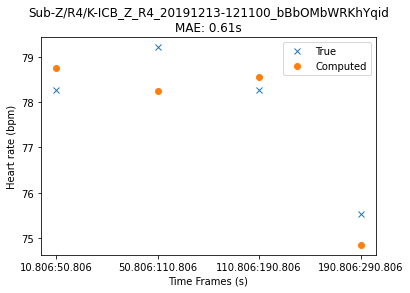

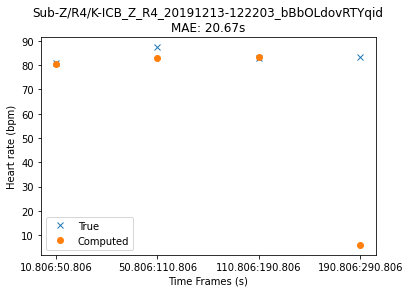

In [47]:
distance_ms = 1000
prominence = 0.25

sec_path_all = []
HR_err_all = []

for idx, m in enumerate(path_all):
    print(idx)
    record = read_record(m)
    scg = record.signals["scg"]
    s6 = detrend(scg.vel[1][:,2])
    coeffs = pywt.wavedec(s6, w, level=8)
    coeffs_HR = copy.deepcopy(coeffs)
    a = coeffs_HR[0]    # 0-0.390625 Hz
    b = coeffs_HR[1]    # 0.390625-0.78125 Hz
    c = coeffs_HR[2]    # 0.78125-1.5625 Hz
    d = coeffs_HR[3]    # 1.5625-3.125 Hz
    e = coeffs_HR[4]    # 3.125-6.25 Hz
    f = coeffs_HR[5]    # 6.25-12.5 Hz
    g = coeffs_HR[6]    # 12.5-25 Hz
    h = coeffs_HR[7]    # 25-50 Hz
    i = coeffs_HR[8]    # 50-100 Hz
    a[:len(a)] = 0
    b[:len(b)] = 0
    c[:len(c)] = 0
    d[:len(d)] = 0
    e[:len(e)] = 0
    h[:len(h)] = 0
    i[:len(i)] = 0  
    HB = pywt.waverec(coeffs_HR, w)
    analytic_signal = hilbert(HB)
    envelope = np.abs(analytic_signal)
    envelope = detrend(envelope)
    envelope = scale_normalization(envelope, rg=(-1, 1))
    envelope = scale_standardization_robust(envelope)
    ecg = record.signals["ecg"]
    ecg = detrend(ecg.lead_I)
    ecg_filt = ecgfilt(ecg)    
    HR_all_true = []
    for k in time_frames:
        ecg_cut = ecg_filt[int(k[0]*fs):int(k[1]*fs)]
        peaks = nk.ecg.ecg_findpeaks(ecg_cut, sampling_rate=fs)
        peaks_t = peaks['ECG_R_Peaks']/fs
        HR_ECG = np.nanmean(60./np.diff(peaks_t))
        HR_all_true.append(HR_ECG)
    HR_all_computed = []
    for k in time_frames:
        env_cut = envelope[int(k[0]*fs):int(k[1]*fs)]
        fpcntile, mpf, fmax, Ptotal, f, P = psd2(env_cut-np.mean(env_cut), fs=fs, nfft=8*np.ceil(len(env_cut)/2), show=False)
        HR_SCG = fmax*60
        HR_all_computed.append(HR_SCG)
    main_path = os.path.normpath(m)
    sec_path = main_path.split(os.sep)
    sec_path = sec_path[7]+'/'+sec_path[8]+'/'+sec_path[9]
    sec_path_all.append(sec_path)
    err = mean_absolute_error(HR_all_true, HR_all_computed)
    HR_err_all.append(err)
    plt.figure()
    x = np.array([0,1,2,3])
    my_xticks = ['10.806:50.806','50.806:110.806','110.806:190.806','190.806:290.806']
    plt.xticks(x, my_xticks)
    plt.plot(my_xticks, HR_all_true, 'x')
    plt.plot(my_xticks, HR_all_computed, 'o')
    plt.xlabel('Time Frames (s)')
    plt.ylabel("Heart rate (bpm)")
    plt.legend(['True', 'Computed'])
    plt.title(sec_path+ '\nMAE: ' +str(format(err, ".2f"))+ 's')

Text(0, 0.5, 'MAE (s)')

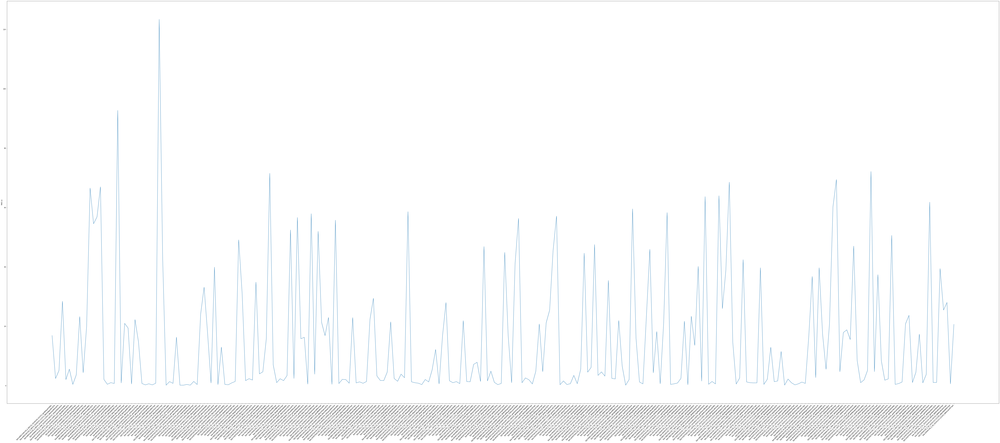

In [48]:
plt.figure(figsize=(120, 50))
x = np.array(range(len(sec_path_all)))
my_xticks = sec_path_all
plt.xticks(x, my_xticks, rotation=45, ha="right")
plt.plot(my_xticks, HR_err_all)
plt.ylabel("MAE (s)")

In [49]:
import pickle

with open("/home/giuseppeditursi/Desktop/Respiration_from_SCG/2_Resp_Extraction/5_Wavelets/Wavelets_HR_err_all", "wb") as fp:   #Pickling
    pickle.dump(HR_err_all, fp)